# Image representation and processing


The project is based on the use of classical image processing methods to solve the problem of creating a clean plate. On the basis of a set of photos taken on an identical background, objects that move are removed in such a way as to obtain a photo containing only the background.

Team members:

  - Sofya Aksenyuk, 150284;

  - Uladzimir Ivashka, 150281

Note: The project is divided into sections in Google Colab, so it is recommended to open it there.

# INITIALIZATION

### Import needed libraries

In [24]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import skimage
import itertools
from scipy.signal import convolve2d
from collections import defaultdict
import pandas as pd
import seaborn as sns
import warnings

### Load datasets

#### "Cathedral" dataset

In [25]:
!wget -O cathedral.zip http://grail.cs.washington.edu/projects/photomontage/data/cathedral.zip && unzip -o cathedral.zip

--2022-11-11 14:01:07--  http://grail.cs.washington.edu/projects/photomontage/data/cathedral.zip
Resolving grail.cs.washington.edu (grail.cs.washington.edu)... 128.208.5.93, 2607:4000:200:14::5d
Connecting to grail.cs.washington.edu (grail.cs.washington.edu)|128.208.5.93|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1342082 (1.3M) [application/zip]
Saving to: ‘cathedral.zip’

cathedral.zip       100%[===================>]   1.28M  2.94MB/s    in 0.4s    

2022-11-11 14:01:08 (2.94 MB/s) - ‘cathedral.zip’ saved [1342082/1342082]

Archive:  cathedral.zip
  inflating: cathedral/d001.jpg      
  inflating: cathedral/d002.jpg      
  inflating: cathedral/d003.jpg      
  inflating: cathedral/d004.jpg      
  inflating: cathedral/d005.jpg      
  inflating: cathedral/result.png    


#### Our own dataset

In [26]:
!wget -O own_dataset.zip https://github.com/allsuitablenamesarealreadytaken/foreground-removal/blob/main/datasets/own_dataset.zip?raw=true && unzip -o own_dataset.zip

--2022-11-11 14:01:08--  https://github.com/allsuitablenamesarealreadytaken/foreground-removal/blob/main/datasets/own_dataset.zip?raw=true
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/allsuitablenamesarealreadytaken/foreground-removal/raw/main/datasets/own_dataset.zip [following]
--2022-11-11 14:01:08--  https://github.com/allsuitablenamesarealreadytaken/foreground-removal/raw/main/datasets/own_dataset.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/allsuitablenamesarealreadytaken/foreground-removal/main/datasets/own_dataset.zip [following]
--2022-11-11 14:01:08--  https://raw.githubusercontent.com/allsuitablenamesarealreadytaken/foreground-removal/main/datasets/own_dataset.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com

### For displaying data

#### Run the cell below in case of using Google Colab

In [27]:
if 'google.colab' in str(get_ipython()):
  from google.colab.patches import cv2_imshow
  imshow = cv2_imshow
else:
  imshow = cv2.imshow

#### Run following piece of code

 (it is only for better text **display** purposes)

In [28]:
def text_description(text):
    print("\n")
    
    fig = plt.figure(figsize=(len(text) / 30, 0.1), facecolor="#383838") 
    plt.plot([x for x in range(10)], [x for x in range(10)])
    plt.clf()
    plt.axis('off')
    t = plt.text(-5, 10, text, fontsize = 22, color="white")
    t.set_position((0, -10))
    plt.show()

#### Resize image

In [29]:
def resize(img):
    res = cv2.resize(img, None, fx=0.5, fy=0.5)

    return res

# FUNCTIONS

### Display initial dataset look 

(i.e., pictures containing moving objects and the reference)

In [30]:
def data_visualization(dataset, result):
    imshow(np.concatenate(dataset, 1))
    imshow(resize(result))

### Get statistics

#### Get dataset intensity distribution

In [31]:
def get_intensity_dist(dataset):
    warnings.filterwarnings("ignore")
    grays = []
    fig, axes = plt.subplots(1, len(dataset), figsize=(20, 5))

    for idx, img in enumerate(dataset):
      gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      grays.append(gray)
      sns.distplot(ax=axes[idx], x=gray.flatten())

    return grays

#### Get average RGB distribution in a dataset

In [32]:
def get_rgb_dist(dataset):
    fig, axes = plt.subplots(1, len(dataset), figsize=(20, 5))
    for idx, img in enumerate(dataset):
      b, g, r = np.mean(img.reshape(-1, 3), axis=0)
      sns.barplot(ax=axes[idx], x = ["B", "G", "R"], y=[b, g, r])

### Background and foreground segmentation

In [33]:
def segmentation(img1, img2):
    """ 
    Finds all places where two images differ; 
    Applies a threshold to eliminate mistakes; 
    And returns bitwise mask with differences
    """

    first_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    first_gray = cv2.GaussianBlur(first_gray, (21, 21), 2)

    gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (21, 21), 2)

    difference = cv2.absdiff(gray, first_gray)

    thresh = cv2.threshold(difference, 25, 255, cv2.THRESH_BINARY)[1]
    thresh = cv2.dilate(thresh, None, iterations=3)

    bitwise_mask = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)

    return bitwise_mask

### Store initial dataset background colors

In [34]:
def get_background_colors(dataset):
    """ 
    Creates background colors collection; 
    Iterates through all possible combinations of images and deletes parts that differ; 
    All the same parts are considered as background and they update the collection
    """ 
    
    background_colors = list()

    for idx, img in enumerate(itertools.combinations(dataset, 2)):

        mask = segmentation(img[0], img[1])

        black_color_mask = np.all(mask == [0, 0, 0], axis=-1)
        mask_applied_0 = np.where(black_color_mask[:, :, np.newaxis] == False, 0, img[0])
        mask_applied_1 = np.where(black_color_mask[:, :, np.newaxis] == False, 0, img[1])

        background_colors.append(mask_applied_0.reshape(-1, 3))
        background_colors.append(mask_applied_1.reshape(-1, 3))

    background_colors = np.array(background_colors).reshape(-1, 3)

    background_colors = set(tuple(x) for x in background_colors)
    background_colors.remove((0, 0, 0))

    return background_colors

### Create "base" image to fill the foreground on

In [35]:
def get_base_img(dataset):
    """ 
    Finds mask with differences for all consecutive images;
    Stores and combines them to get base image with removed foreground
    """
        
    joined_masks  = np.median(np.stack(dataset, axis=3), axis=3).astype(np.uint8)
    mask = np.zeros(joined_masks.shape)
    all_masks = []

    for idx in range(len(dataset) - 1):
        
        bitwise_mask = segmentation(dataset[idx], dataset[idx + 1])

        result = cv2.bitwise_and(joined_masks, ~bitwise_mask)
        result += cv2.bitwise_and(result, bitwise_mask)

        joined_masks = result.copy()
        all_masks.append(result)

    return joined_masks, all_masks

### Calculate MLE 

Maximum Likelihood (Neighborhood) Estimation:

Method of estimating the parameters of an assumed probability distribution, given some observed data. 

This is achieved by maximizing a likelihood function so that, under the assumed statistical model, the observed data is most probable.

In [36]:
def mle(img):
    """ 
    Performs Maximum Likelihood Estimation algorithm for image;
    The output looks like a matrix with calculated probability for each pixel, w.r.t. other ones
    """
    
    mean = img.reshape(-1, 3).mean(axis=0)
    cov = np.cov(img.reshape(-1, 3), rowvar=False, bias=True)
    cov_inv = np.linalg.inv(cov)
    prob = img - mean
    vectorized = np.tensordot(prob, cov_inv, axes=([2],[1]))

    return np.exp(np.einsum('ijk,ijk->ij', -0.5 * prob, vectorized))

### Collect set of pixel color probabilities 

In [37]:
def get_pixel_probs(dataset):
    """ 
    Calls MLE function for each image and stores results
    """    

    probs = []
    for img in dataset:
        probs.append(mle(img))

    probs = np.array(probs)
    probs = probs.reshape(len(probs), -1, 1)

    return probs

### Get final image

In [38]:
def get_final_img(dataset, joined_masks):
    """ 
    Fills empty pixels in the base image with pixels from dataset images(consecutively),
    the probability of which is bigger than some threshold
    """    

    final_img = joined_masks.copy().reshape(-1, 3)
    probs = get_pixel_probs(dataset)

    for idx, img in enumerate(dataset):
        img = img.reshape(-1, 3)
        final_img = np.where((final_img == 0) & (probs[idx] > 0.15), img,  final_img)

    return final_img.reshape(dataset[0].shape)

### Fill in black-colored pixels 

(i.e., left blank with colors obtained from background of picture above)

In [39]:
def fill_with_background_colors(dataset, final_img, background_colors):
    """ 
    Fills all remained empty pixels of the base image with pixels from dataset images(consecutively), 
    which are in the background colors collection and are in the same place
    """ 
        
    final_img = final_img.reshape(-1, 3)
    for idx, img in enumerate(dataset):
      img = img.reshape(-1, 3)
      for pix in range(img.shape[0]):
        if list(final_img[pix]) == [0, 0, 0] and tuple(img[pix]) in background_colors:
            final_img[pix] = img[pix]

    return final_img.reshape(dataset[0].shape)

### Average neighbor pixels for pixels left blank

(black in the picture above)

In [40]:
def neighbor_average(img):
    """ 
    Computes value for a pixel, based on the mean value for the specified neighborhood
    """ 
        
    kernel = np.ones((21, 21))

    neighbor_sum = convolve2d(img, kernel, mode='same', boundary='fill', fillvalue=0)
    num_neighbor = convolve2d(np.ones(img.shape), kernel, mode='same', boundary='fill', fillvalue=0)

    return neighbor_sum / num_neighbor

### Apply neighbor averaging

In [41]:
def apply_neighbor_average(final_img):
    """ 
    Applies the `neighbor_average` function for all remained empty pixels of the base image
    """ 
        
    final_img = final_img.copy().reshape(-1, 3)
    final_img = np.where(final_img == 0, neighbor_average(final_img), final_img)

    return final_img

# MAIN

In [42]:
def main(code):
    if code == 'cathedral':
        dataset = list(cv2.imread(f"./cathedral/d00{x}.jpg", 1) for x in range(1, 6))
        result = cv2.imread('./cathedral/result.png', 1)
    else:
        dataset = list(cv2.imread(f"./own_dataset/image-{x}.jpg", 1) for x in range(1, 5))
        result = cv2.imread('./own_dataset/reference-image.jpg', 1)
    
    ## Display initial dataset look
    text_description('Dataset pictures with moving objects and the reference image')
    data_visualization(dataset, result)

    ## Display dataset intensity distribution
    text_description('Dataset intensity distribution')
    imshow(np.concatenate(get_intensity_dist(dataset), 1))

    ## Display average RGB distribution in the dataset
    text_description('Dataset RGB distribution')
    get_rgb_dist(dataset)

    ## Apply median value to the images as an intermediate result 
    text_description('Median value applied')
    imshow(np.median(np.stack(dataset, axis=3), axis=3).astype(np.uint8))

    ## Display combined removed foreground obtained from all images
    text_description('Foreground segmantation combined')
    joined_masks = get_base_img(dataset)
    imshow(resize(joined_masks[0]))

    ## Display separately removed foreground obtained from each image
    text_description('Foreground segmantation applied to each picture')
    joined_masks = get_base_img(dataset)
    imshow(np.concatenate(joined_masks[1], 1))

    ## Collect set of pixel color probabilities based on MLE
    probs = get_pixel_probs(dataset)

    ## Display the result of previous step
    text_description('Pixel probability thresholding applied')
    final_img = get_final_img(dataset, joined_masks[0])
    imshow(final_img.reshape(dataset[0].shape))

    ## Collect set of background colors based on image with foreground removed
    background_colors = get_background_colors(dataset)

    ## Fill in pixels left blank
    text_description('Pixel left blank filled with the obtained background colors')
    final_img = fill_with_background_colors(dataset, final_img, background_colors)
    imshow(final_img)

    ## Display final result
    text_description('Final resulting image')
    final_img = apply_neighbor_average(final_img)
    imshow(final_img.reshape(dataset[0].shape))

### Run for "Cathedral" dataset

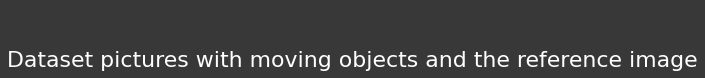

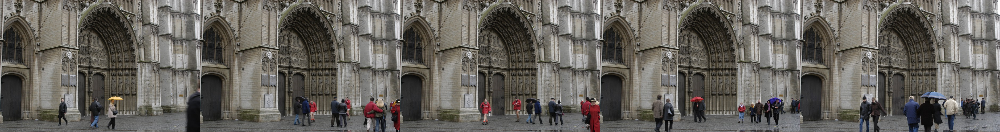

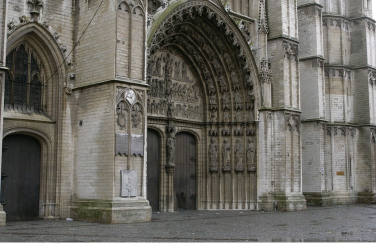

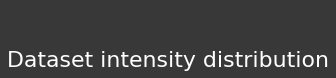

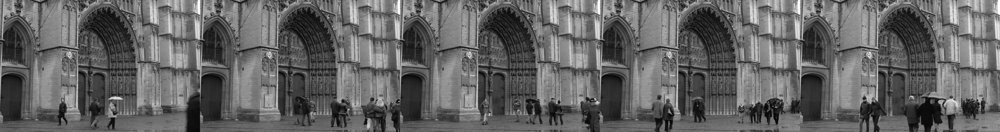

...

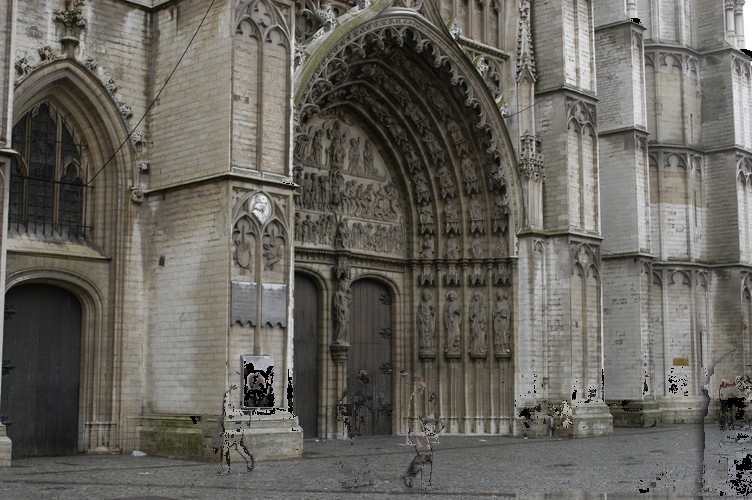

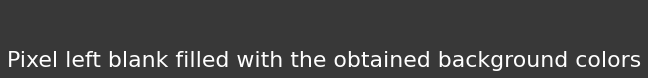

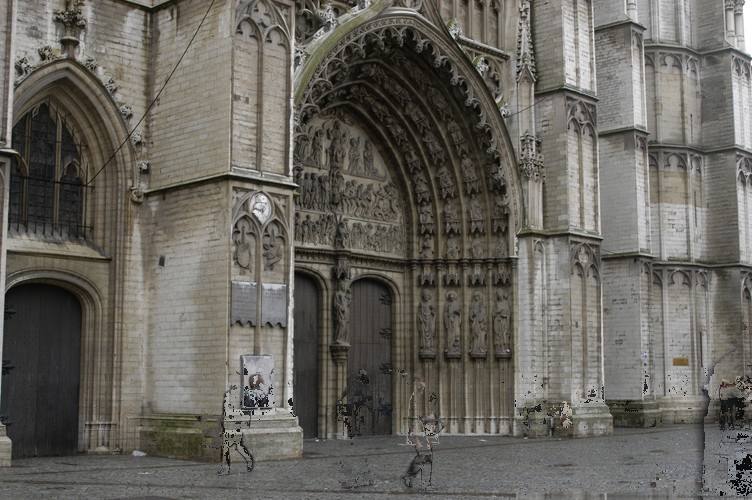

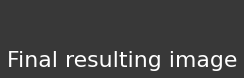

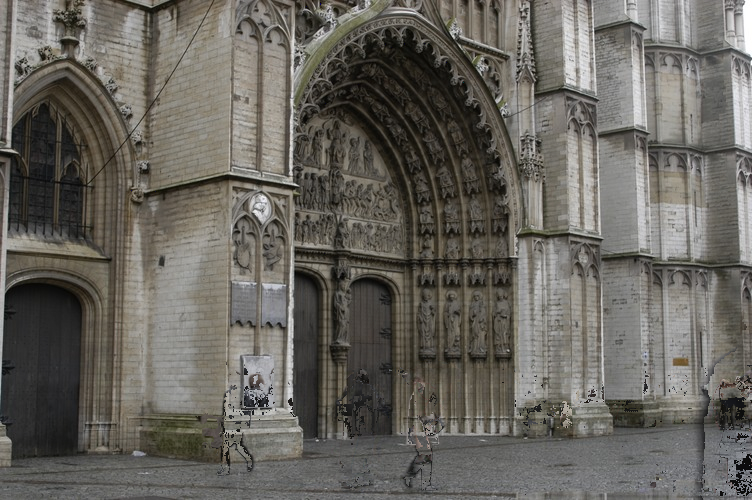

In [43]:
main('cathedral')

### Run for our own dataset

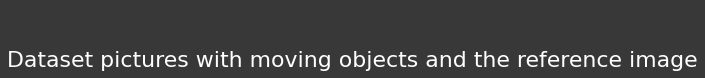

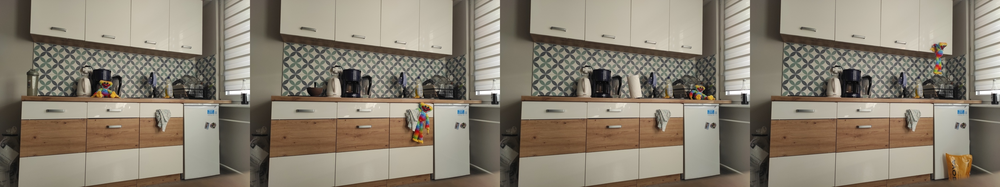

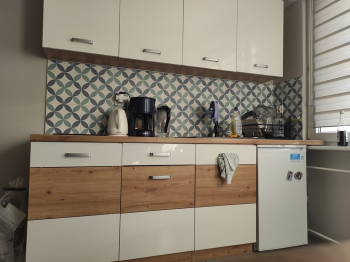

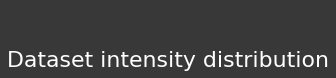

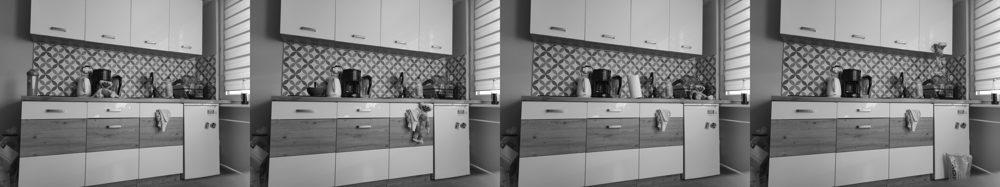

...

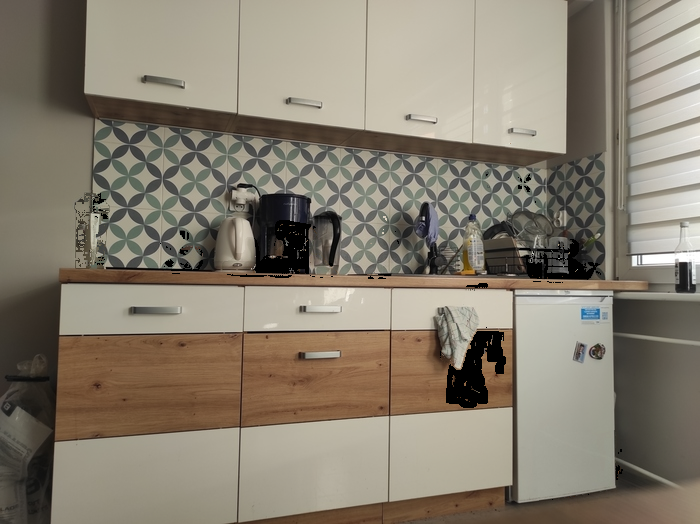

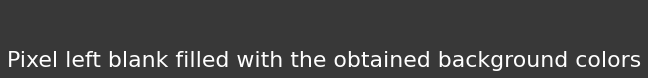

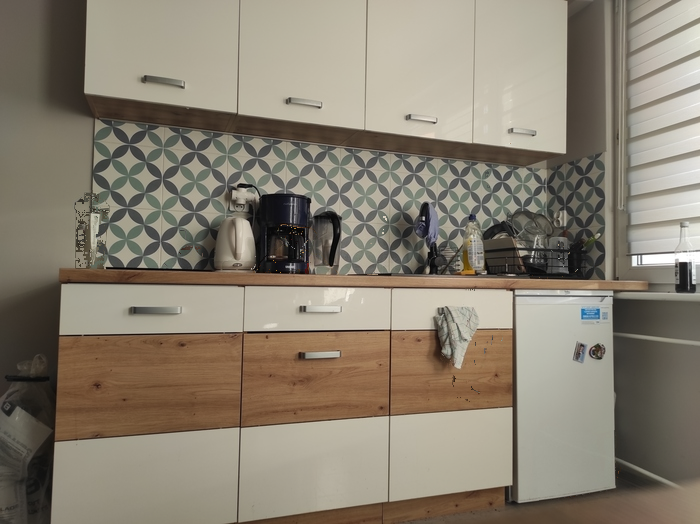

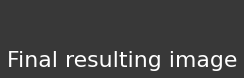

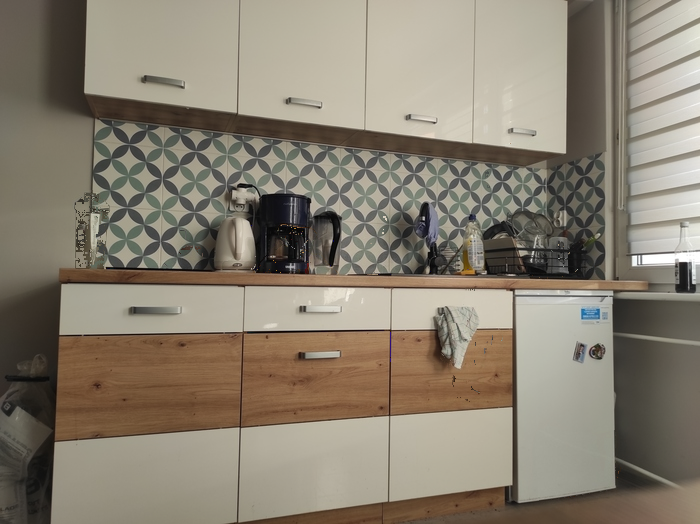

In [44]:
main('own')

# CONCLUSIONS OF RESULTS AND ERRORS

> The main error is incompleteness of resulting image (some pixels are left blank so that image seems "noisy"):
  - The blurring filter could be not fully correctly implemented;

> Some minor pixel colors do ***not*** match with the reference image ones:
  - Applied approach minor bugs (e.e, in collecting background pixels colors or calculating their probabilities);

> In case of images with less detailed background, just applying median could be enough (e.g., in our own dataset case).



# REFERENCES



> "Interactive Digital Photomontage" paper: http://grail.cs.washington.edu/projects/photomontage/photomontage.pdf

